In [150]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
import matplotlib.animation as animation
from matplotlib import rc
from sklearn.datasets import make_blobs
from random import sample
from random import random
import random
from sklearn.model_selection import train_test_split

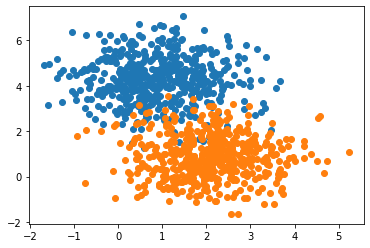

In [151]:
X, y = make_blobs(n_samples=1000, centers=2, random_state=0)
X[:5], y[:5]
fig, ax = plt.subplots()
for label in [0, 1]:
  mask = (y == label)
  ax.scatter(X[mask, 0], X[mask, 1])

In [152]:
def hingeLoss(v):    
    return(np.where(v<1, 1-v, 0))

def hingeloss_derivative(v):
    return(np.where(v<1, -1, 0))

In [153]:
def J(theta, theta0, X, y, lamb = 0.001):
    n = len(y)
    suma = 1/n*np.sum(hingeLoss(y*(np.dot(X, theta.transpose())+theta0))) + lamb/2*np.dot(theta, theta)
    return suma

def dJ(theta, theta0, X, y, lamb = 0.001):
    n = len(y)
    suma =  1/n*np.sum(np.dot(hingeloss_derivative(y*(np.dot(X, theta.transpose())+theta0)), y)*X, axis = 0) + lamb*theta
    return suma

In [154]:
def dJ_0 (theta, theta0, X, y):
    n = len(y)
    suma =  1/n*np.sum(np.dot(hingeloss_derivative(y*(np.dot(X, theta.transpose())+theta0)), y))
    return suma

In [155]:
def gradientDescentSVM(X, y, theta_, theta0_, learningRate, iter = 500, eps = 1e-6, lamb = 0.01):
    theta = theta_
    theta0 = theta0_
    n = len(y)
    t = 0   
    thetas = []
    

    while True and t < iter:
        t = t+1
        thetaT = theta - learningRate*dJ(theta, theta0, X, y)
        theta0T = theta0 - learningRate*dJ_0(theta, theta0, X, y)
        if abs(J(theta, theta0, X, y)- J(thetaT, theta0T, X, y)) <  eps:
            break
        theta = thetaT
        theta0 =  theta0T
        
        thetas.append([-theta0/theta[1],-theta[0]/theta[1]])
    return (thetaT, theta0T, thetas)

In [156]:
def crossValidation(X, y, k, lamb):
    M, N =  X.shape 
    size = int(M/k )
    error = 0
    theta = np.array([np.random.rand() for i in range (N)])
    theta0 = np.random.rand()            
    
    for i in range(k):
        leftX = X[0:size*i, :]
        rightX = X[size*(i+1): M , :]     
        leftY = y[0:size*i]
        rightY = y[size*(i+1): M ]   
       
        theta,theta0,t_ = gradientDescentSVM(np.concatenate((leftX, rightX)), np.concatenate((leftY, rightY)), theta, theta0, 0.01,           lamb = lamb)         
        testingSetX = X[size*i:size*(i+1), :]
        testingSetY = y[size*i:size*(i+1)]        
        error += sum([1 if np.dot(y[j], np.dot(theta, X[j][:]) + theta0) <= 0 else 0 for j in range(size) ])    
    return 1/k*error
    

In [157]:
error = crossValidation(X,y,5,.001)

In [158]:
def perceptron(X, y, tao = 100):
    M, N =  X.shape 
    theta = np.zeros(N)
    theta0 = np.zeros(1)        

    thetas = []
    for i in range(tao):        
        for j in range(M):
     
            if np.dot(y[j], np.dot(theta, X[j][:]) + theta0) <= 0:
                theta = theta + y[j]*X[j][:]
                theta0 = theta0 + y[j]                
                thetas.append([-theta0/theta[1],-theta[0]/theta[1]])                
        
    return (theta, theta0, thetas)

In [159]:
def test(X, y, metodo, percentage = 0.8, lr = 0.1, lamb = 0.2):
    n = int(len(y)*percentage)    
    M, N = X.shape

    index = sample([i for i in range(len(y))], n) 
    
   
    ceros = np.zeros(len(y), dtype=bool)
    ceros[index] = True
    trainingSetX = X[ceros,]
    trainingSetY = y[ceros]        

    unos = np.ones(len(y), dtype = bool)
    unos[index] = False
    testSetX = X[unos,]
    testSetY = y[unos]
    

    if metodo == "Perceptron" : 
        theta, theta0, thetas = perceptron(trainingSetX, trainingSetY)   
    elif metodo == "SVM":
        array = np.array([np.random.rand() for i in range (N)])
        theta, theta0, thetas = gradientDescentSVM(trainingSetX, trainingSetY, array, np.random.rand(), lr, lamb = lamb)
    else:
        thetaEst, thetasEst = SVM_S_G_D(X, Y, lamb = lamb, learning_rate = lr)
    
   
    correct = [0 if testSetY[i]*(np.dot(theta, testSetX[i,:])+theta0) <= 0 else 1 for i in range(len(testSetY))]
    print("Presición de : " + str(sum(correct)/len(testSetY)*100) + "%")
    return (theta, theta0, thetas)

In [160]:
iris = load_iris()

X = iris.data
Y = iris.target

X = X[Y<2, 0:2]
Y = Y[Y<2]

Y = np.where(Y == 0, 1, -1)

In [161]:
theta, theta0, thetas = perceptron(X,Y, tao = 200)

In [162]:
print(theta, theta0)

[-53.6  81.3] [40.]


In [163]:
print(thetas)

[[array([-0.28571429]), -1.457142857142857], [array([-0.]), 6.333333333333338], [array([-0.26315789]), -0.8421052631578946], [array([-0.]), 6.333333333333338], [array([-0.24390244]), -0.3170731707317071], [array([-0.]), 6.333333333333338], [array([-0.22727273]), 0.13636363636363671], [array([-0.]), 6.333333333333338], [array([-0.21276596]), 0.5319148936170217], [array([-0.]), 5.933333333333338], [array([-0.2]), 0.7600000000000007], [array([-0.25]), -0.13749999999999976], [array([-0.20833333]), 1.2291666666666674], [array([-0.24096386]), 0.09638554216867501], [array([-0.19607843]), 1.5294117647058831], [array([-0.23255814]), 0.3139534883720934], [array([-0.18518519]), 1.7962962962962976], [array([-0.2247191]), 0.5168539325842701], [array([-0.1754386]), 1.9298245614035099], [array([-0.2173913]), 0.6413043478260875], [array([-0.26086957]), 0.12173913043478295], [array([-0.24096386]), 1.0120481927710847], [array([-0.25423729]), 0.2796610169491529], [array([-0.23255814]), 1.1976744186046515

In [164]:
def animacion(figura, data):
    x = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 200)
    def anima(i):            
        y = data[i][0] +data[i][1] * x
        line.set_data(x, y)
        return line,
    return animation.FuncAnimation(figura, anima, frames=len(data), interval=100, blit=True)


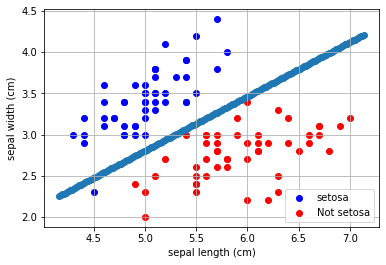

In [165]:
fig, ax = plt.subplots()

line, = ax.plot([], [], 'k-')

ax.scatter(X[Y==1, 0], X[Y==1, 1], c='b', label=iris.target_names[0])
ax.scatter(X[Y==-1, 0], X[Y==-1, 1], c='r', label="Not setosa")
ax.legend(loc='lower right')

ax.set_xlabel(iris.feature_names[0])
ax.set_ylabel(iris.feature_names[1])

x = np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 200)
ax.scatter(x, -theta0/theta[1] -theta[0]/theta[1]*x)

ax.grid(True)

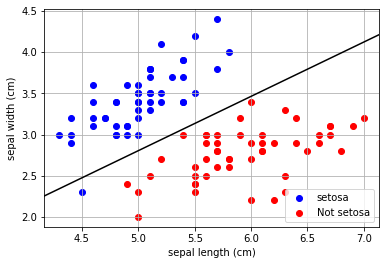

In [166]:
fig, ax = plt.subplots()

line, = ax.plot([], [], 'k-')

ax.scatter(X[Y==1, 0], X[Y==1, 1], c='b', label=iris.target_names[0])
ax.scatter(X[Y==-1, 0], X[Y==-1, 1], c='r', label="Not setosa")
ax.legend(loc='lower right')

ax.set_xlabel(iris.feature_names[0])
ax.set_ylabel(iris.feature_names[1])


ax.grid(True)
animado = animacion(fig, thetas)

rc('animation', html='jshtml')
animado

In [169]:
n = int(len(Y)*0.8)    
index = sample([i for i in range(len(Y))], n)     
    
ceros = np.zeros(len(Y), dtype=bool)
ceros[index] = True
trainingSetX = X[ceros,]
trainingSetY = Y[ceros]        

unos = np.ones(len(Y), dtype = bool)
unos[index] = False
testSetX = X[unos,]
testSetY = Y[unos] 

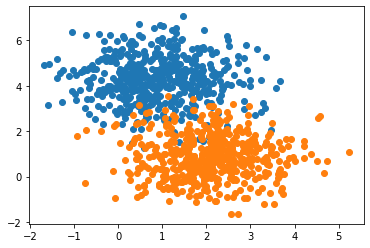

In [170]:
X, y = make_blobs(n_samples=1000, centers=2, random_state=0)
X[:5], y[:5]
fig, ax = plt.subplots()
for label in [0, 1]:
  mask = (y == label)
  ax.scatter(X[mask, 0], X[mask, 1])

In [171]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

In [172]:
def agreement(X, Y, theta, theta_0):
    z = Y * (np.dot(theta, X) + theta_0)
    return np.where(z<1, -1, 0)

In [173]:
def derivada_cost_function(X, Y, theta, theta_0, lamb):
    suma = 0
    for i in range(len(X)):
        suma += np.sum(agreement(X, Y, theta, theta_0)) * Y * X
    j = 1 / len(X) * suma + lamb * theta    
    return j

In [174]:
def SVM_S_G_D(X, Y, lamb, T):
    
    n = len(X)
    theta = np.zeros(2)
    lista_thetas = []
    
    for t in range(T):
        eta_t = 1/(1+t)
        i = np.random.randint(n)
        theta -= eta_t * derivada_cost_function(X[i,:], Y[i], theta, 0, lamb)
        lista_thetas.append((0, -theta[0] / theta[1]))
    
    return (theta, lista_thetas)

In [175]:
(theta, lista_thetas) = SVM_S_G_D(X_train, y_train, 0.2, 200)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


In [176]:
def anima(i):
    y = lista_thetas[i][0] + lista_thetas[i][1] * x
    line.set_data(x, y)
    return line,

In [177]:
animacion = animation.FuncAnimation(fig, anima, frames=len(lista_thetas), interval=100, blit=True)
rc('animation', html='jshtml')
animacion

In [178]:
iris = load_iris()

X = iris.data
Y = iris.target

X = X[Y<2, 0:2]
Y = Y[Y<2]

Y = np.where(Y == 0, 1, -1)

In [179]:
n = int(len(Y)*0.8)    
index = sample([i for i in range(len(Y))], n)     
    
ceros = np.zeros(len(Y), dtype=bool)
ceros[index] = True
trainingSetX = X[ceros,]
trainingSetY = Y[ceros]        

unos = np.ones(len(Y), dtype = bool)
unos[index] = False
testSetX = X[unos,]
testSetY = Y[unos] 

In [180]:
errores = []
lambdas = []

for i in range (1, 100):
    lambdas.append (1/i)
    errores.append (crossValidation(X, Y, 5, 1/i))    

#Seleccionamos el valor de lambda que genera el menor error
minimo=min(errores)
indice=errores.index(minimo)
lambda_optima = lambdas[indice]


In [181]:
print(lambda_optima)

0.1


In [185]:
# Tomamos lambda = 0.1
thetaSVM, theta0SVM, thetasSVM = test(X, Y, "SVM", lr = 0.1, lamb = 0.1)


Presición de : 25.0%


In [186]:
theta, theta0, thetas = test(X,Y, "Perceptron")


Presición de : 100.0%


In [187]:
#theta, theta0, thetas = test(X,Y, "SVM_S_G_D", lr = 0.1, lamb = 0.2)

Conclusión 

La presición del algoritmo Perceptron fue mucho mayor que la de descenso por gradiente del clasificador lineal de máximo margen. La variación del Perceptron inicia moviendose mmucho, pero al final converge.
Después de varias prubas, ek valor de la lambda óptima cambió de 0.2 a 0.1 aunque desconoces la razón de porque y diferencia entre la presición de los métodos aumentó, ya que ahora la presición del perceptrón fué del 100% y la del algóritmo de máquina de vectores de soprte disminuyó a 25%.